<a href="https://colab.research.google.com/github/Niushamesgari/Deep-learning-project/blob/main/object_detection_bees.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0TmfXz3UZSSiUMPMstoB")
project = rf.workspace("roboflow-100").project("bees-jt5in")
version = project.version(2)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 2.3 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics==8.0.196`, to intall it `pip install ultralytics==8.0.196`.



Extracting Dataset Version Zip to bees-2 in yolov8:: 100%|██████████| 16172/16172 [00:09<00:00, 1756.75it/s]


In [2]:
config_file_template = '''
names:
- bees
nc: 1
roboflow:
  license: CC BY 4.0
  project: bees-jt5in
  url: https://universe.roboflow.com/roboflow-100/bees-jt5in/dataset/2
  version: 2
  workspace: roboflow-100
test: /content/bees-2/test/images
train: /content/bees-2/train/images
val: /content/bees-2/valid/images
'''

with open('/content/bees-2/data.yaml', 'w') as f:
    f.write(config_file_template)

In [3]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [5]:
from ultralytics import YOLO
model = YOLO('yolov8n.yaml').load('yolov8n.pt')
# build from YAML and transfer weights

# Train the model
results = model.train(data="/content/bees-2/data.yaml", epochs=20, imgsz=(1125,508))

100%|██████████| 6.25M/6.25M [00:00<00:00, 102MB/s]

Transferred 355/355 items from pretrained weights


Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/content/bees-2/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=(1125, 508), save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tr

100%|██████████| 755k/755k [00:00<00:00, 20.2MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/bees-2/train/labels... 5640 images, 892 backgrounds, 0 corrupt: 100%|██████████| 5640/5640 [00:13<00:00, 425.97it/s]


train: New cache created: /content/bees-2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/bees-2/valid/labels... 1604 images, 237 backgrounds, 0 corrupt: 100%|██████████| 1604/1604 [00:04<00:00, 379.29it/s]


val: New cache created: /content/bees-2/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1152 train, 1152 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20       8.1G      2.018      3.925       1.41         11       1152: 100%|██████████| 353/353 [05:34<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:35<00:00,  1.45it/s]


                   all       1604       1950      0.629      0.547       0.58      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.29G      1.978       1.93      1.408         19       1152: 100%|██████████| 353/353 [05:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.67it/s]


                   all       1604       1950      0.685      0.578      0.636      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.28G      1.978      1.637      1.407         17       1152: 100%|██████████| 353/353 [05:23<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:28<00:00,  1.80it/s]


                   all       1604       1950      0.697      0.655      0.685      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.28G       1.93      1.507      1.384         15       1152: 100%|██████████| 353/353 [05:19<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.70it/s]


                   all       1604       1950      0.708      0.654       0.69       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      7.32G      1.907      1.412      1.354         26       1152: 100%|██████████| 353/353 [05:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.65it/s]

                   all       1604       1950      0.794      0.742      0.787      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      7.33G      1.891      1.336      1.338         14       1152: 100%|██████████| 353/353 [05:21<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.69it/s]

                   all       1604       1950      0.795      0.759      0.801      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.33G      1.861      1.311      1.328         13       1152: 100%|██████████| 353/353 [05:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:27<00:00,  1.85it/s]


                   all       1604       1950      0.789      0.755      0.805      0.363

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20       7.4G      1.844      1.262      1.315         21       1152: 100%|██████████| 353/353 [05:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.67it/s]

                   all       1604       1950      0.816      0.707      0.795      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.28G      1.809      1.226      1.302         23       1152: 100%|██████████| 353/353 [05:19<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.67it/s]


                   all       1604       1950      0.791      0.763      0.812      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.32G      1.813      1.185       1.29         13       1152: 100%|██████████| 353/353 [05:23<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.65it/s]

                   all       1604       1950      0.814      0.809      0.843      0.383


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      7.28G      1.804      1.159      1.335         11       1152: 100%|██████████| 353/353 [05:12<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:28<00:00,  1.78it/s]

                   all       1604       1950      0.819      0.786       0.84        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      7.28G       1.78      1.135      1.332          8       1152: 100%|██████████| 353/353 [05:03<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:31<00:00,  1.63it/s]


                   all       1604       1950      0.819      0.807      0.845      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      7.28G      1.754      1.091      1.314          7       1152: 100%|██████████| 353/353 [05:08<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:28<00:00,  1.78it/s]

                   all       1604       1950      0.836      0.799      0.854      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      7.28G      1.743      1.046      1.311          6       1152: 100%|██████████| 353/353 [05:06<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:29<00:00,  1.71it/s]

                   all       1604       1950      0.827      0.812      0.854      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      7.34G      1.717      1.024      1.283          8       1152: 100%|██████████| 353/353 [05:10<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:29<00:00,  1.74it/s]

                   all       1604       1950       0.82      0.825      0.859      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      7.28G      1.706      0.994      1.284          7       1152: 100%|██████████| 353/353 [05:09<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:31<00:00,  1.60it/s]

                   all       1604       1950      0.815      0.825      0.865      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      7.28G      1.686     0.9641      1.277         12       1152: 100%|██████████| 353/353 [05:11<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:28<00:00,  1.82it/s]

                   all       1604       1950      0.843      0.842       0.88       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      7.39G      1.659     0.9354      1.256          7       1152: 100%|██████████| 353/353 [05:06<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.70it/s]


                   all       1604       1950       0.84       0.84      0.881      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      7.28G      1.639     0.9124      1.246         12       1152: 100%|██████████| 353/353 [05:08<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.69it/s]

                   all       1604       1950      0.849      0.842      0.885      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      7.28G      1.614     0.8861      1.232          7       1152: 100%|██████████| 353/353 [05:09<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:28<00:00,  1.80it/s]

                   all       1604       1950      0.845      0.856      0.892      0.451



20 epochs completed in 1.934 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:30<00:00,  1.68it/s]


                   all       1604       1950      0.845      0.856      0.891       0.45
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train


In [6]:
model.export()

Ultralytics YOLOv8.2.76 🚀 Python-3.10.12 torch-2.3.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 1152, 1152) BCHW and output shape(s) (1, 5, 27216) (6.0 MB)

TorchScript: starting export with torch 2.3.1+cu121...
TorchScript: export success ✅ 3.8s, saved as 'runs/detect/train/weights/best.torchscript' (12.1 MB)

Export complete (6.4s)
Results saved to /content/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.torchscript imgsz=1152  
Validate:        yolo val task=detect model=runs/detect/train/weights/best.torchscript imgsz=1152 data=/content/bees-2/data.yaml  
Visualize:       https://netron.app


'runs/detect/train/weights/best.torchscript'


0: 1152x1152 1 bees, 60.1ms
1: 1152x1152 1 bees, 60.1ms
2: 1152x1152 (no detections), 60.1ms
3: 1152x1152 1 bees, 60.1ms
Speed: 9.0ms preprocess, 60.1ms inference, 2.3ms postprocess per image at shape (1, 3, 1152, 1152)


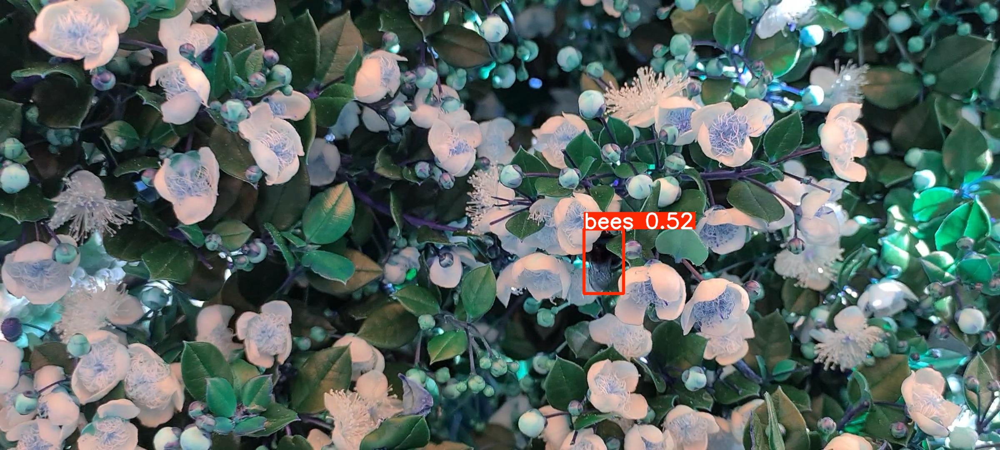

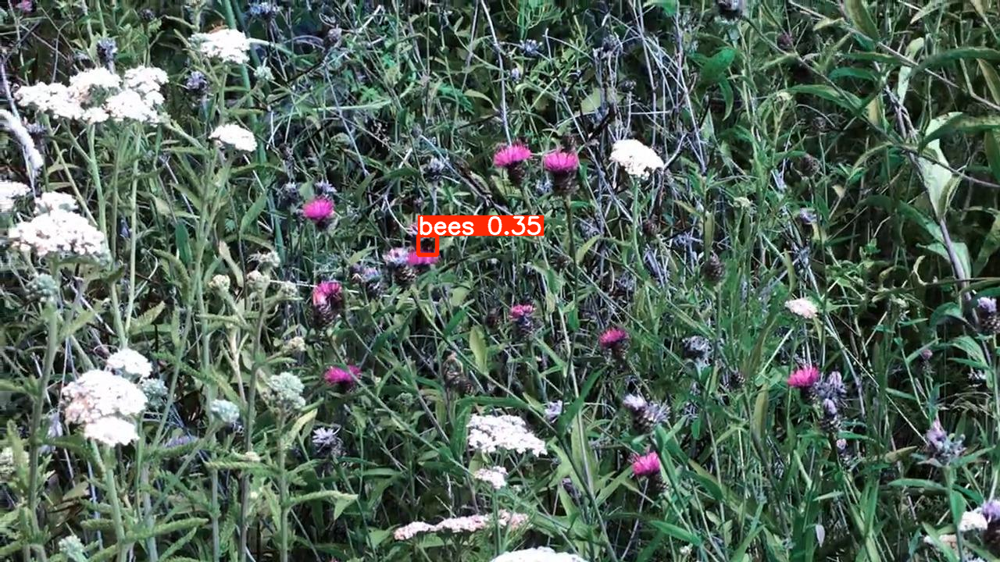

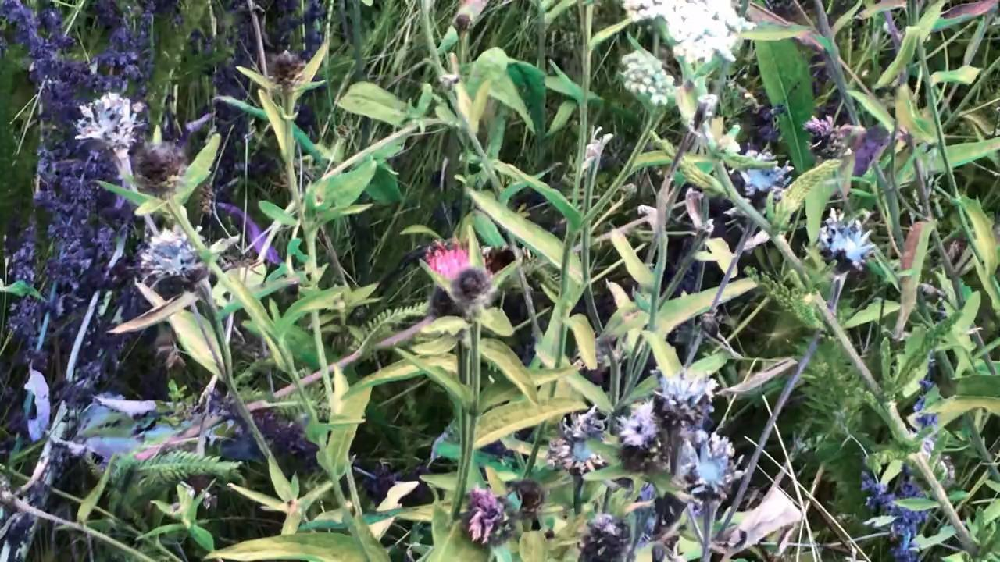

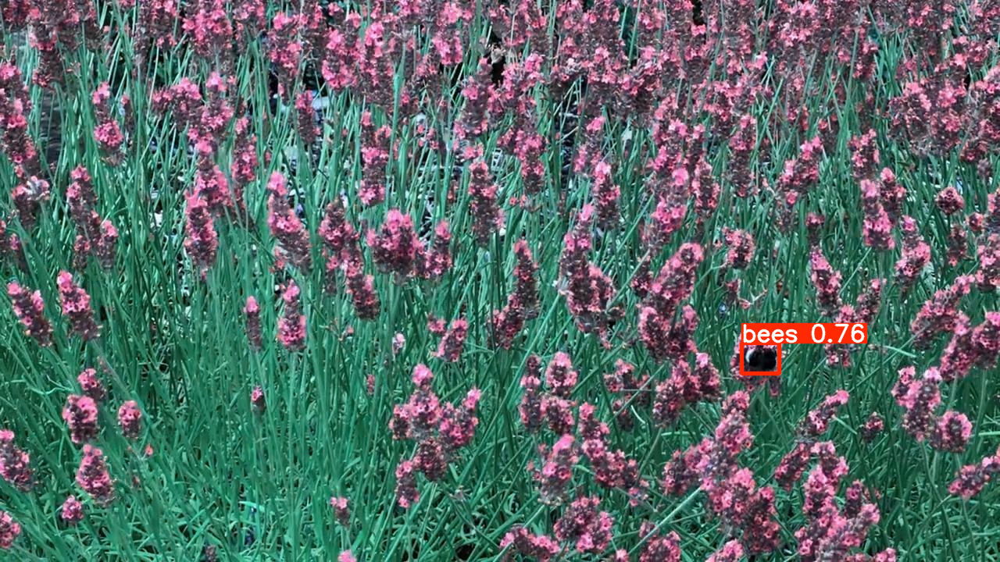

In [7]:
import glob
from PIL import Image
test_image=glob.glob('/content/bees-2/test/images/*.jpg')
results=model(test_image[4:8],stream=False)
for i in range(4):
    res=results[i].plot()
    display(Image.fromarray(res))


In [8]:
#for solving the bug
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [9]:
!pip install --upgrade gradio==4.29

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 107.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.6/314.6 kB 26.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.9/141.9 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 120.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 12.0 MB/s eta 0:00:00
  Attempting uninstall: tomlkit
    Found existin

In [13]:
import gradio as gr


def detect_img(img):

  results=model([img],stream=False)
  res=results[0].plot()
  return Image.fromarray(res)


them = gr.themes.Soft(primary_hue="yellow", secondary_hue="stone", neutral_hue="yellow")


demo=gr.Interface(
    fn=detect_img,
    inputs=[gr.Image(format='pil')],
    outputs=[gr.Image(format = "pil")],
    theme=them,
    title = "Bees Detection App",
    examples = test_image[10:15]
)

In [ ]:
demo.launch(debug=True,share=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://921ac1755b8a428e45.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)



0: 672x1152 1 bees, 63.8ms
Speed: 12.8ms preprocess, 63.8ms inference, 2.2ms postprocess per image at shape (1, 3, 672, 1152)
